In [1]:
import pandas as pd
import numpy as np

In [2]:
import matplotlib.pyplot as plt
import seaborn as sns
#for visualization

In [3]:
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.model_selection import train_test_split
#for preprocessing

In [4]:
# to ignore warnings
import warnings
warnings.filterwarnings('ignore')

In [5]:
from google.colab import files
files.upload()

Saving soil_heavy_metal_dataset.csv to soil_heavy_metal_dataset.csv


{'soil_heavy_metal_dataset.csv': b'Location_ID,Latitude,Longitude,Sample_Depth_cm,Soil_Type,Ni,Pb,Cr,Hg,Cd,As,Cu,Zn,Contamination_Level\r\n1,35.465018,-119.405433,33,Loamy,12.15,140.67,161.15,9.88,8.84,14.33,19.39,112.81,Low\r\n2,35.186667,-119.466985,30,Loamy,96.22,70.37,246.16,3.88,8.15,3.92,75.08,346.55,Moderate\r\n3,35.161664,-120.425729,43,Loamy,95.17,62.92,27.5,4.29,4.96,8.69,16.7,270.59,Low\r\n4,35.01,-120.661857,35,Clay,146.79,89.11,222.63,6.85,5.36,17.87,85.23,190.62,Moderate\r\n5,35.484727,-119.386529,38,Clay,76.04,226.97,114.83,8.37,7.64,9.39,83.79,394.88,Moderate\r\n6,35.415552,-119.438655,42,Sandy,193.8,78.83,164.3,4.23,0.42,5.33,29.3,96.65,Moderate\r\n7,35.872451,-119.884266,43,Loamy,180.45,254.04,148.19,2.06,4.8,2.51,91.67,260.5,Moderate\r\n8,35.835143,-120.215114,43,Sandy,45.38,36.14,43.98,7.26,0.88,19.44,39.75,182.09,Low\r\n9,34.595996,-120.465595,22,Clay,112.79,30.75,180.93,3.37,5.92,15.37,28.94,267.22,Moderate\r\n10,35.275481,-119.651797,49,Loamy,146.35,243.83,247.96

In [6]:
df = pd.read_csv("soil_heavy_metal_dataset.csv")

In [7]:
print("First 5 rows:")
display(df.head())

First 5 rows:


,Location_ID,Latitude,Longitude,Sample_Depth_cm,Soil_Type,Ni,Pb,Cr,Hg,Cd,As,Cu,Zn,Contamination_Level
0,1,35.465018,-119.405433,33,Loamy,12.15,140.67,161.15,9.88,8.84,14.33,19.39,112.81,Low
1,2,35.186667,-119.466985,30,Loamy,96.22,70.37,246.16,3.88,8.15,3.92,75.08,346.55,Moderate
2,3,35.161664,-120.425729,43,Loamy,95.17,62.92,27.50,4.29,4.96,8.69,16.70,270.59,Low
3,4,35.010000,-120.661857,35,Clay,146.79,89.11,222.63,6.85,5.36,17.87,85.23,190.62,Moderate
4,5,35.484727,-119.386529,38,Clay,76.04,226.97,114.83,8.37,7.64,9.39,83.79,394.88,Moderate


In [8]:
print("\nDataset Shape:", df.shape)


Dataset Shape: (1000, 14)


In [9]:
df.info()
#column info

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 14 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Location_ID          1000 non-null   int64  
 1   Latitude             1000 non-null   float64
 2   Longitude            1000 non-null   float64
 3   Sample_Depth_cm      1000 non-null   int64  
 4   Soil_Type            1000 non-null   object 
 5   Ni                   1000 non-null   float64
 6   Pb                   1000 non-null   float64
 7   Cr                   1000 non-null   float64
 8   Hg                   1000 non-null   float64
 9   Cd                   1000 non-null   float64
 10  As                   1000 non-null   float64
 11  Cu                   1000 non-null   float64
 12  Zn                   1000 non-null   float64
 13  Contamination_Level  1000 non-null   object 
dtypes: float64(10), int64(2), object(2)
memory usage: 109.5+ KB


In [10]:
df.sample(10)

,Location_ID,Latitude,Longitude,Sample_Depth_cm,Soil_Type,Ni,Pb,Cr,Hg,Cd,As,Cu,Zn,Contamination_Level
742,743,34.007094,-120.906594,44,Silt,96.96,257.57,126.64,9.17,0.97,6.98,22.51,369.71,Moderate
445,446,34.608215,-120.236504,42,Clay,47.98,45.94,107.92,8.83,1.05,2.55,66.52,68.24,Low
369,370,35.262513,-119.002765,37,Silt,87.96,58.25,68.82,1.65,7.37,17.83,15.51,256.04,Moderate
256,257,34.905987,-120.188847,49,Clay,80.78,289.75,47.34,8.03,2.23,11.97,73.55,373.86,Moderate
512,513,34.667518,-119.588358,17,Silt,199.27,231.53,224.65,9.45,5.53,0.56,13.10,234.18,Moderate
788,789,35.717815,-119.803607,37,Clay,27.53,280.65,176.20,4.27,9.24,1.42,35.40,322.35,Moderate
180,181,35.687283,-119.504122,17,Silt,147.38,118.47,160.67,0.26,8.56,19.61,97.10,99.45,Moderate
365,366,34.525925,-120.868628,40,Sandy,160.47,151.18,156.91,8.35,7.14,1.86,77.20,42.17,Moderate
274,275,34.122192,-119.496428,34,Loamy,128.90,101.84,211.61,3.70,3.05,11.83,85.36,303.13,Moderate
189,190,34.297494,-119.190702,12,Sandy,144.38,83.98,87.75,8.82,2.55,8.10,74.84,309.24,Moderate


In [11]:
df.isnull().sum()
#missing values

,0
Location_ID,0
Latitude,0
Longitude,0
Sample_Depth_cm,0
Soil_Type,0
Ni,0
Pb,0
Cr,0
Hg,0
Cd,0


In [12]:
df.describe()
#statistics

,Location_ID,Latitude,Longitude,Sample_Depth_cm,Ni,Pb,Cr,Hg,Cd,As,Cu,Zn
count,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.00000,1000.00000,1000.000000,1000.000000
mean,500.500000,34.993929,-120.029242,29.072000,105.860350,153.610140,131.791970,5.195400,5.12285,9.93580,51.706470,211.896080
std,288.819436,0.581940,0.575505,11.360188,55.172674,80.930446,67.022953,2.879134,2.88234,5.80869,27.962431,110.403066
min,1.000000,34.001017,-120.995786,10.000000,10.060000,15.100000,20.000000,0.040000,0.10000,0.10000,5.040000,20.540000
25%,250.750000,34.473798,-120.530781,19.000000,59.827500,85.905000,75.077500,2.700000,2.59500,4.76250,27.172500,121.035000
50%,500.500000,34.987170,-120.052808,29.000000,105.615000,148.770000,128.680000,5.260000,5.23000,10.00500,51.165000,205.675000
75%,750.250000,35.502499,-119.534794,39.000000,155.820000,225.710000,188.692500,7.652500,7.62500,14.93250,76.252500,307.420000
max,1000.000000,35.992106,-119.002307,49.000000,199.980000,299.890000,249.990000,10.000000,9.99000,19.98000,99.900000,399.890000


In [13]:
df.columns.tolist()

['Location_ID',
 'Latitude',
 'Longitude',
 'Sample_Depth_cm',
 'Soil_Type',
 'Ni',
 'Pb',
 'Cr',
 'Hg',
 'Cd',
 'As',
 'Cu',
 'Zn',
 'Contamination_Level']

In [14]:
df.iloc[:,9:36].sample(5)

,Cd,As,Cu,Zn,Contamination_Level
147,4.26,7.27,25.61,177.35,Moderate
950,6.35,3.78,8.08,192.57,Moderate
796,8.17,15.52,74.20,121.63,Moderate
713,6.50,3.04,13.14,378.21,Moderate
37,4.36,7.57,24.49,113.59,Low


In [15]:
#removing duplicates
initial_rows = df.shape[0]
df = df.drop_duplicates()
final_rows = df.shape[0]
print(f"\nRemoved {initial_rows - final_rows} duplicate rows.")


Removed 0 duplicate rows.


In [16]:
#encoding categorical values
label_encoders = {}

for col in df.select_dtypes(include='object').columns:
    le = LabelEncoder()
    df[col] = le.fit_transform(df[col])
    label_encoders[col] = le

In [17]:
#what is features & target
target_column = "Contamination_Level"

X = df.drop(target_column, axis=1)
y = df[target_column]

In [18]:
#feature scaling
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

X = pd.DataFrame(X_scaled, columns=X.columns)

In [19]:
#train-test split
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

print("\nTrain Shape:", X_train.shape)
print("Test Shape:", X_test.shape)


Train Shape: (800, 13)
Test Shape: (200, 13)


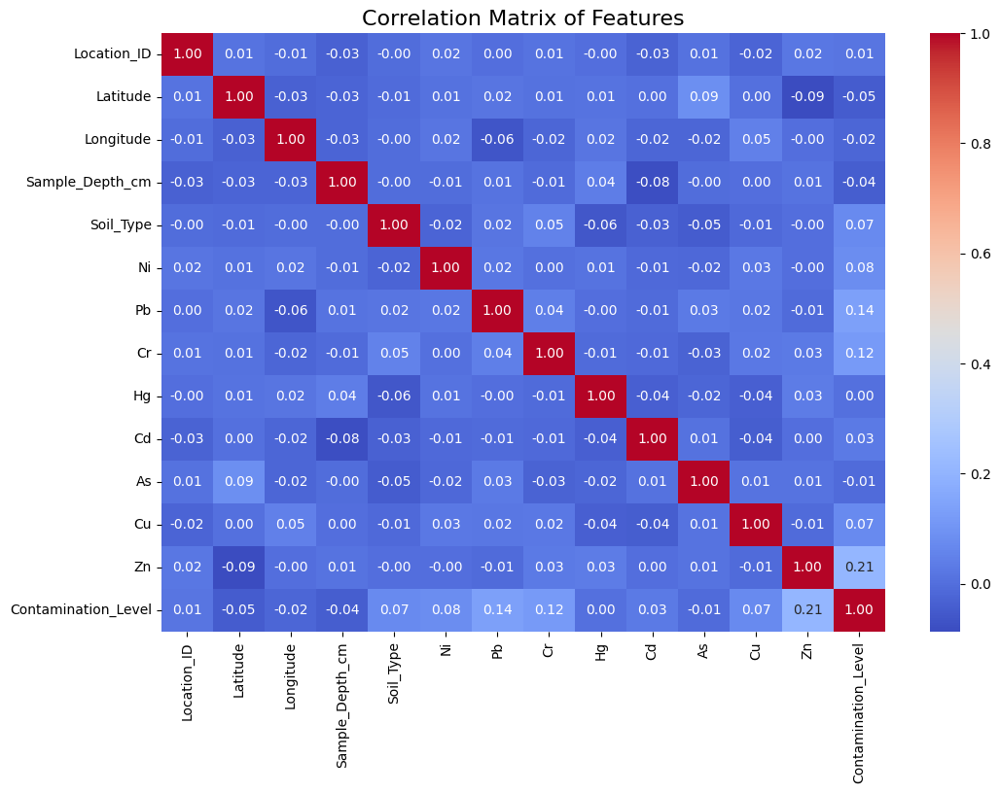

In [20]:
#correlation matrix
plt.figure(figsize=(12, 8))

corr = df.corr()

sns.heatmap(corr, annot=True, cmap="coolwarm", fmt=".2f")

plt.title("Correlation Matrix of Features", fontsize=16)
plt.show()

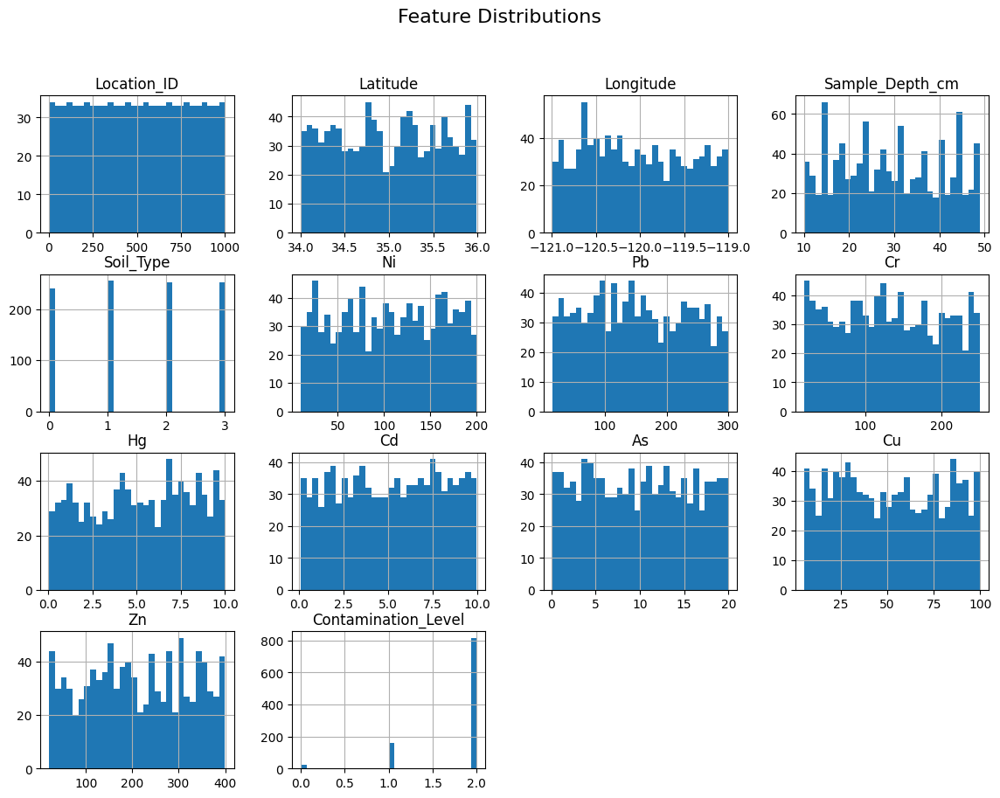

In [21]:
#distribution plots
df.hist(figsize=(14, 10), bins=30)
plt.suptitle("Feature Distributions", fontsize=16)
plt.show()

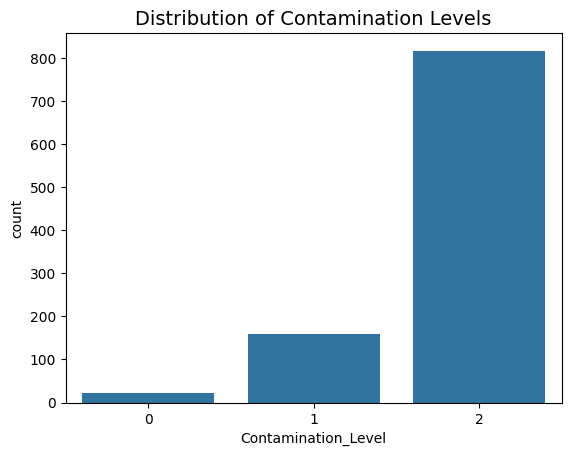

In [22]:
#target distribution
sns.countplot(x='Contamination_Level', data=df)

plt.title("Distribution of Contamination Levels", fontsize=14)
plt.show()

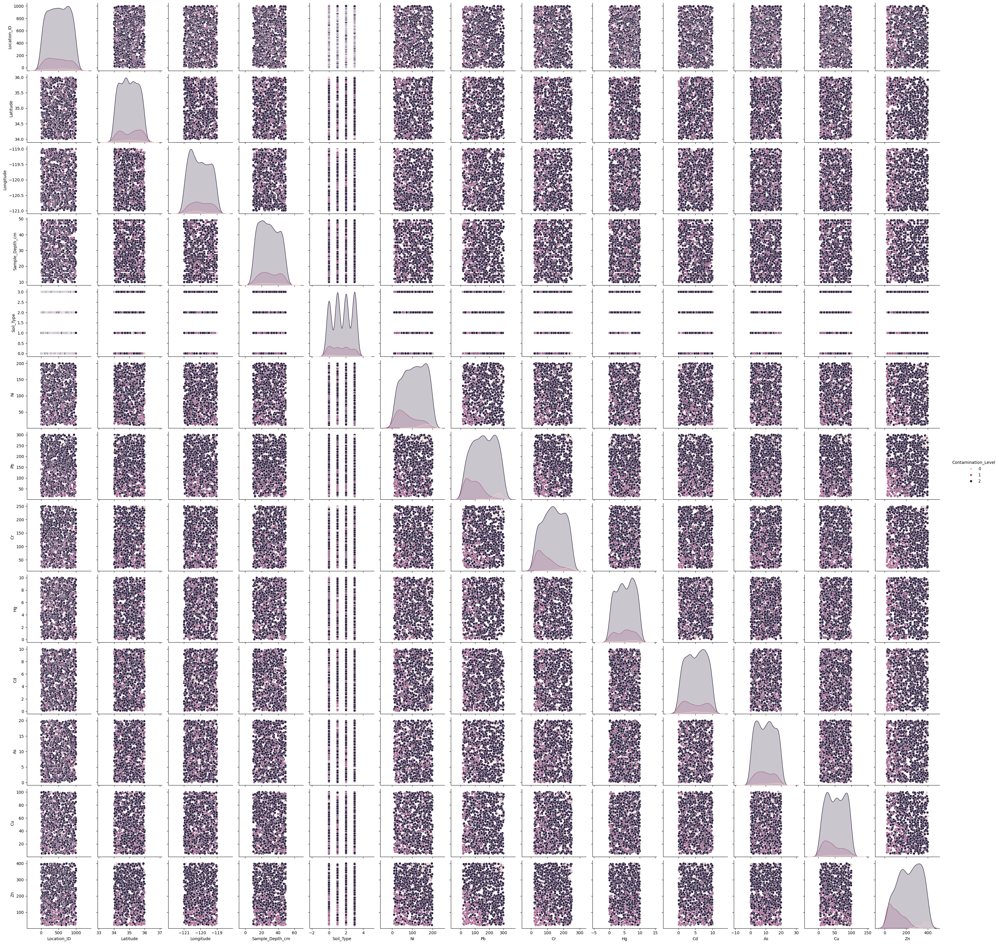

In [23]:
#pairplot
sns.pairplot(df, hue='Contamination_Level')
plt.show()

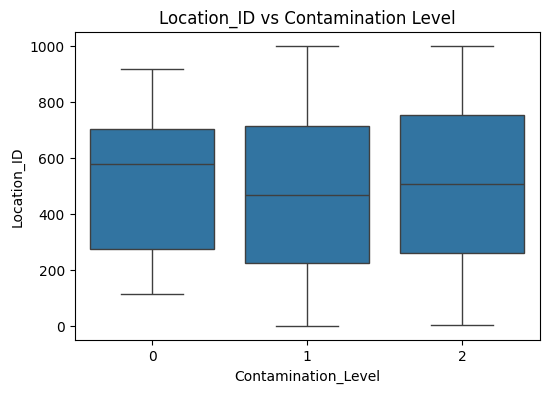

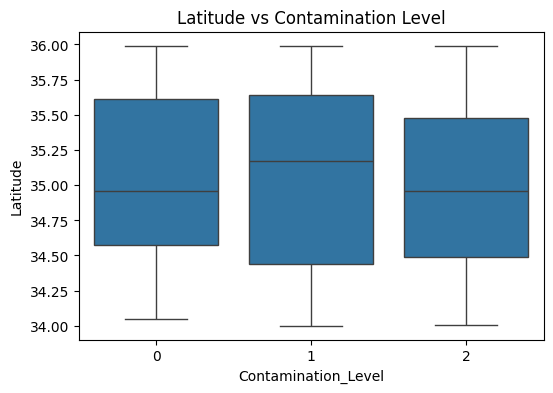

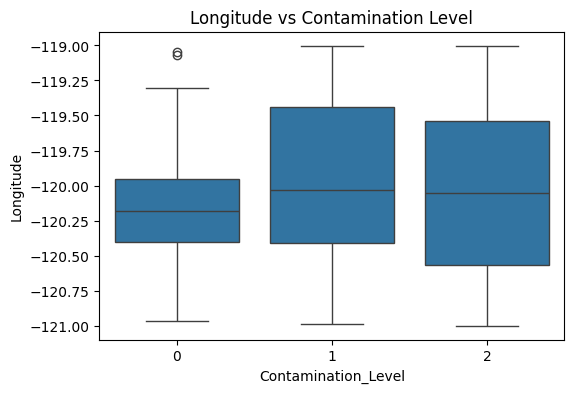

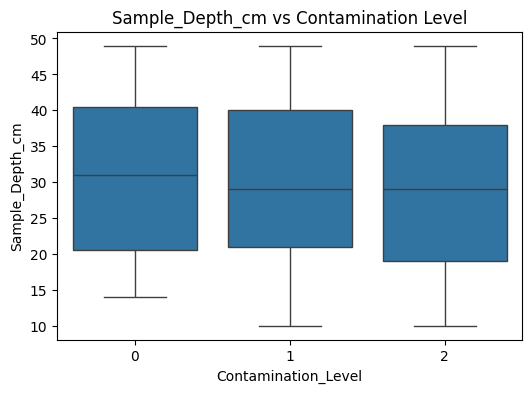

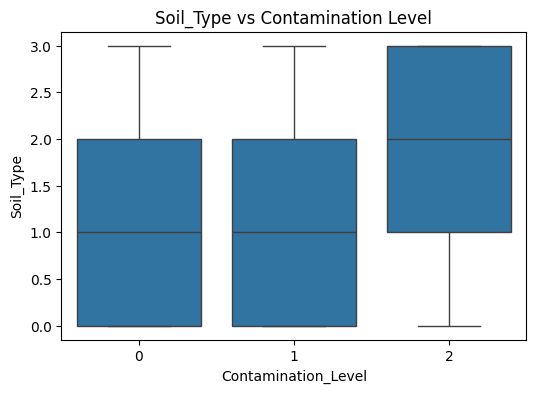

...

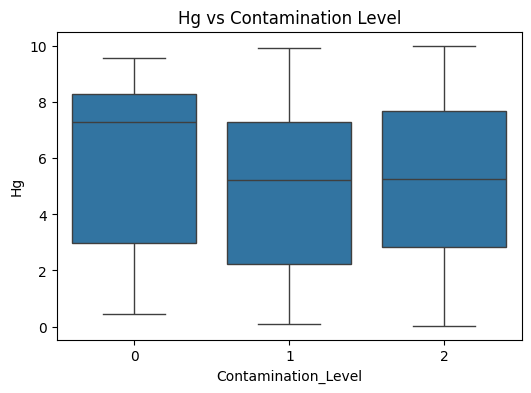

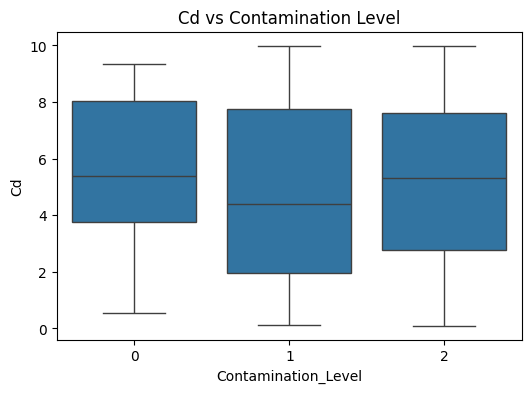

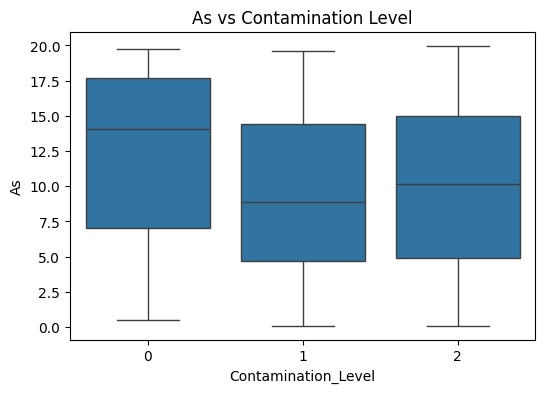

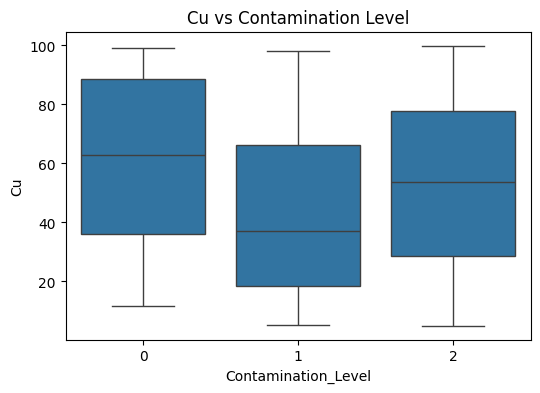

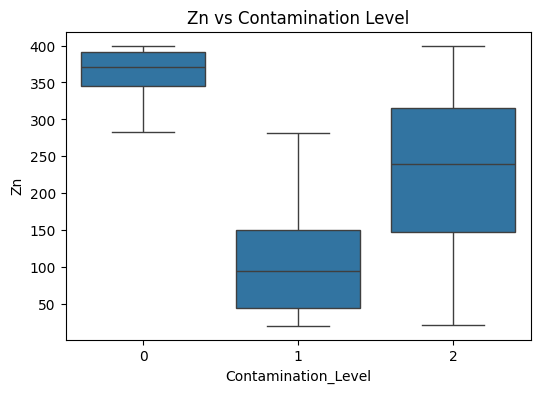

In [24]:
#feature vs target analysis
features = X.columns

for feature in features:
    plt.figure(figsize=(6, 4))
    sns.boxplot(x=y, y=df[feature])
    plt.title(f"{feature} vs Contamination Level")
    plt.show()

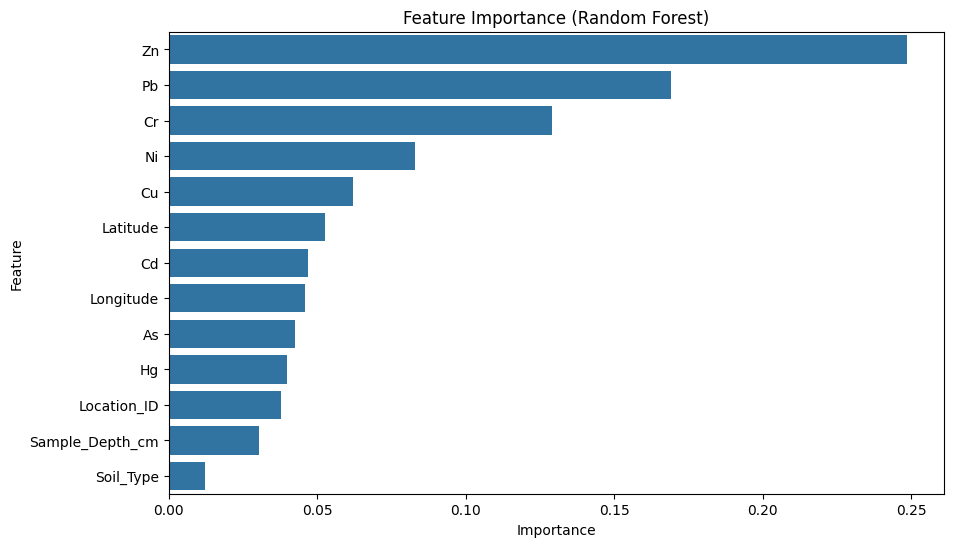

,Feature,Importance
12,Zn,0.248544
6,Pb,0.169233
7,Cr,0.128975
5,Ni,0.082986
11,Cu,0.062079
1,Latitude,0.052684
9,Cd,0.046969
2,Longitude,0.045939
10,As,0.042389
8,Hg,0.039842


In [25]:
#feature importance
from sklearn.ensemble import RandomForestClassifier

rf = RandomForestClassifier(random_state=42)
rf.fit(X_train, y_train)

importances = rf.feature_importances_

feature_importance_df = pd.DataFrame({
    'Feature': X.columns,
    'Importance': importances
}).sort_values(by='Importance', ascending=False)

# Plot
plt.figure(figsize=(10,6))
sns.barplot(x='Importance', y='Feature', data=feature_importance_df)
plt.title("Feature Importance (Random Forest)")
plt.show()

feature_importance_df.head(10)

In [26]:
# to keep top features only
top_features = feature_importance_df['Feature'][:10]

X_selected = X[top_features]

In [27]:
#PCA
from sklearn.decomposition import PCA

pca = PCA()

X_pca = pca.fit_transform(X)

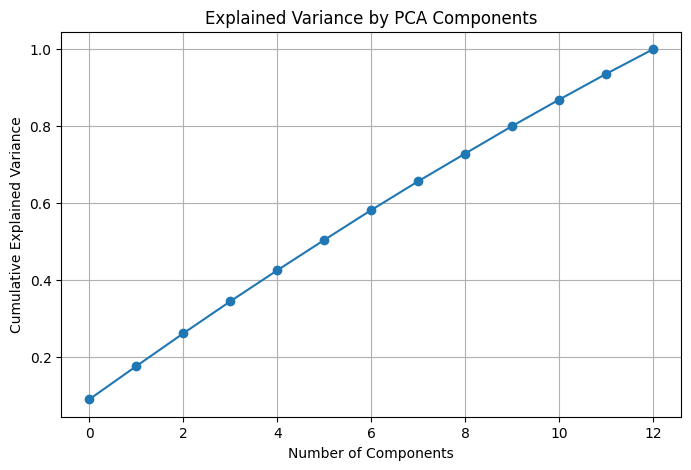

In [28]:
# Explained variance plot
plt.figure(figsize=(8,5))
plt.plot(np.cumsum(pca.explained_variance_ratio_), marker='o')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Explained Variance by PCA Components')
plt.grid()
plt.show()

In [29]:
# Choose number of components (example: 95% variance)
pca = PCA(n_components=0.95)

X_pca = pca.fit_transform(X)

print("Reduced shape:", X_pca.shape)

Reduced shape: (1000, 13)


In [30]:
#importing models
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.svm import SVC

#advanced models
from xgboost import XGBClassifier

#Metrics
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

In [31]:
#model dictionary
models = {
    "Logistic Regression": LogisticRegression(max_iter=1000),
    "Decision Tree": DecisionTreeClassifier(random_state=42),
    "Random Forest": RandomForestClassifier(random_state=42),
    "Gradient Boosting": GradientBoostingClassifier(random_state=42),
    "SVM": SVC(),
    "XGBoost": XGBClassifier(use_label_encoder=False, eval_metric='mlogloss')
}

In [32]:
#training & evaluating models
results = []

for name, model in models.items():

    # Train model
    model.fit(X_train, y_train)

    # Predictions
    y_pred = model.predict(X_test)

    # Metrics
    acc = accuracy_score(y_test, y_pred)
    prec = precision_score(y_test, y_pred, average='weighted')
    rec = recall_score(y_test, y_pred, average='weighted')
    f1 = f1_score(y_test, y_pred, average='weighted')

    results.append({
        "Model": name,
        "Accuracy": acc,
        "Precision": prec,
        "Recall": rec,
        "F1 Score": f1
    })

In [33]:
#results table
results_df = pd.DataFrame(results)
results_df = results_df.sort_values(by="Accuracy", ascending=False)

results_df

,Model,Accuracy,Precision,Recall,F1 Score
0,Logistic Regression,0.975,0.975359,0.975,0.971899
5,XGBoost,0.945,0.921860,0.945,0.932200
4,SVM,0.930,0.906098,0.930,0.917760
3,Gradient Boosting,0.920,0.905524,0.920,0.912613
2,Random Forest,0.905,0.889863,0.905,0.884893
1,Decision Tree,0.785,0.797298,0.785,0.790684


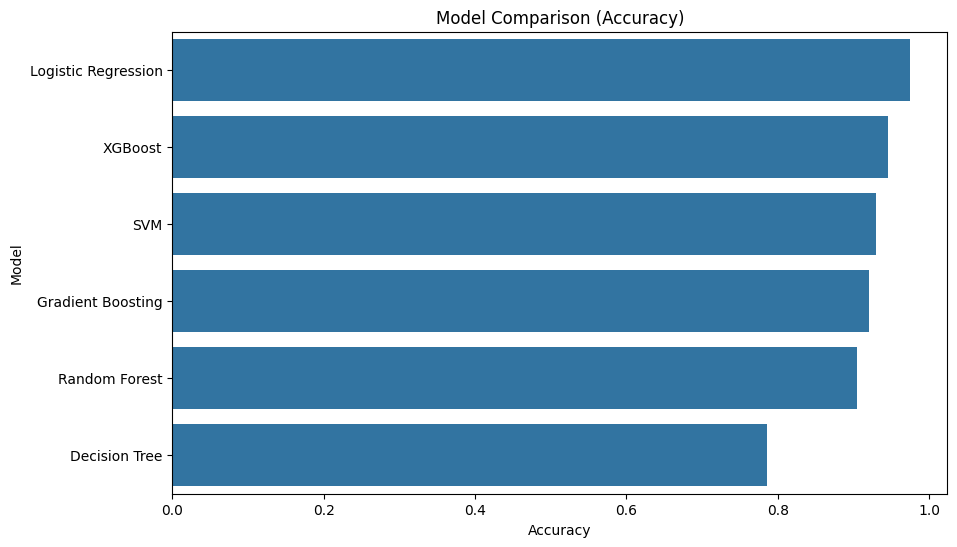

In [34]:
#comparison of model visually
plt.figure(figsize=(10,6))

sns.barplot(x="Accuracy", y="Model", data=results_df)

plt.title("Model Comparison (Accuracy)")
plt.show()

In [35]:
#cross validation
from sklearn.model_selection import cross_val_score

models_cv = {
    "Logistic Regression": LogisticRegression(max_iter=1000),
    "SVM": SVC(),
    "XGBoost": XGBClassifier(use_label_encoder=False, eval_metric='mlogloss')
}

for name, model in models_cv.items():
    scores = cross_val_score(model, X, y, cv=5, scoring='accuracy')
    print(f"{name}: Mean Accuracy = {scores.mean():.4f}, Std = {scores.std():.4f}")

Logistic Regression: Mean Accuracy = 0.9790, Std = 0.0086
SVM: Mean Accuracy = 0.9300, Std = 0.0110
XGBoost: Mean Accuracy = 0.9350, Std = 0.0095


In [36]:
#hyperparameter tuning- Logistic regression
from sklearn.model_selection import GridSearchCV

param_grid_lr = {
    'C': [0.01, 0.1, 1, 10],
    'solver': ['lbfgs', 'liblinear']
}

grid_lr = GridSearchCV(LogisticRegression(max_iter=1000),
                       param_grid_lr, cv=5, scoring='accuracy')

grid_lr.fit(X_train, y_train)

print("Best Parameters (LR):", grid_lr.best_params_)
print("Best Score (LR):", grid_lr.best_score_)

Best Parameters (LR): {'C': 10, 'solver': 'lbfgs'}
Best Score (LR): 0.985


In [37]:
#hyperparameter tuning- SVM
param_grid_svm = {
    'C': [0.1, 1, 10],
    'kernel': ['linear', 'rbf']
}

grid_svm = GridSearchCV(SVC(), param_grid_svm, cv=5, scoring='accuracy')

grid_svm.fit(X_train, y_train)

print("Best Parameters (SVM):", grid_svm.best_params_)
print("Best Score (SVM):", grid_svm.best_score_)

Best Parameters (SVM): {'C': 10, 'kernel': 'linear'}
Best Score (SVM): 0.97875


In [38]:
#hyperparameter tuning- XGBoost
param_grid_xgb = {
    'n_estimators': [100, 200],
    'max_depth': [3, 5, 7],
    'learning_rate': [0.01, 0.1]
}

grid_xgb = GridSearchCV(
    XGBClassifier(use_label_encoder=False, eval_metric='mlogloss'),
    param_grid_xgb,
    cv=5,
    scoring='accuracy'
)

grid_xgb.fit(X_train, y_train)

print("Best Parameters (XGB):", grid_xgb.best_params_)
print("Best Score (XGB):", grid_xgb.best_score_)

Best Parameters (XGB): {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 100}
Best Score (XGB): 0.9325000000000001


In [39]:
#evaluation of optimised models
best_lr = grid_lr.best_estimator_
best_svm = grid_svm.best_estimator_
best_xgb = grid_xgb.best_estimator_

models_final = {
    "Optimized Logistic Regression": best_lr,
    "Optimized SVM": best_svm,
    "Optimized XGBoost": best_xgb
}

final_results = []

for name, model in models_final.items():
    y_pred = model.predict(X_test)

    final_results.append({
        "Model": name,
        "Accuracy": accuracy_score(y_test, y_pred),
        "Precision": precision_score(y_test, y_pred, average='weighted'),
        "Recall": recall_score(y_test, y_pred, average='weighted'),
        "F1 Score": f1_score(y_test, y_pred, average='weighted')
    })

final_results_df = pd.DataFrame(final_results)
final_results_df

,Model,Accuracy,Precision,Recall,F1 Score
0,Optimized Logistic Regression,0.980,0.980606,0.980,0.978906
1,Optimized SVM,0.975,0.975697,0.975,0.971980
2,Optimized XGBoost,0.950,0.951352,0.950,0.942894


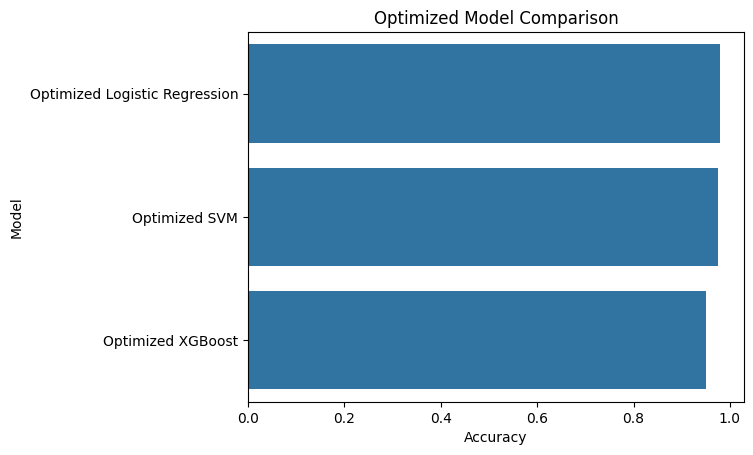

In [40]:
#visualization
sns.barplot(x="Accuracy", y="Model", data=final_results_df)
plt.title("Optimized Model Comparison")
plt.show()

In [41]:
!pip install shap

In [42]:
#SHAP analysis

import shap

# Create explainer
explainer = shap.Explainer(best_lr, X_train)

# Calculate SHAP values
shap_values = explainer(X_test)

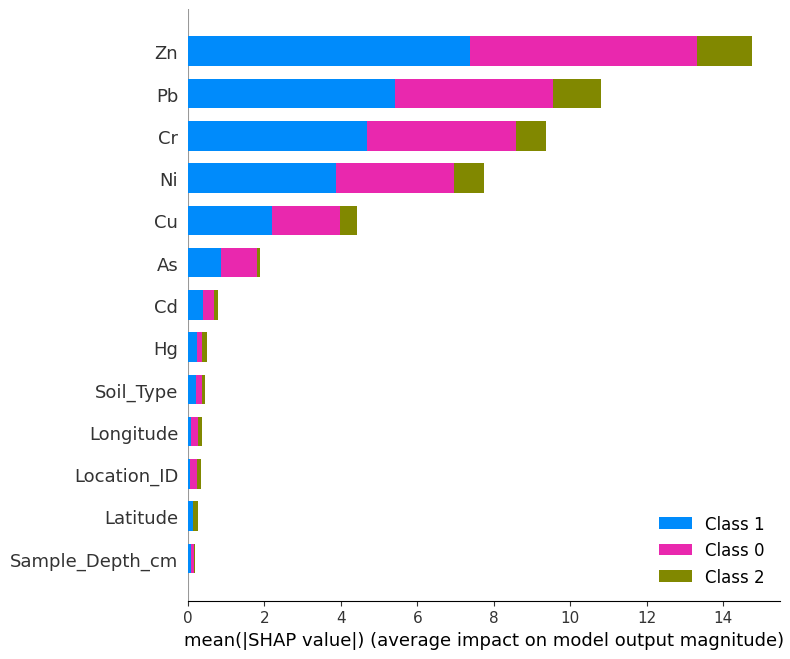

In [43]:
shap.summary_plot(shap_values, X_test)

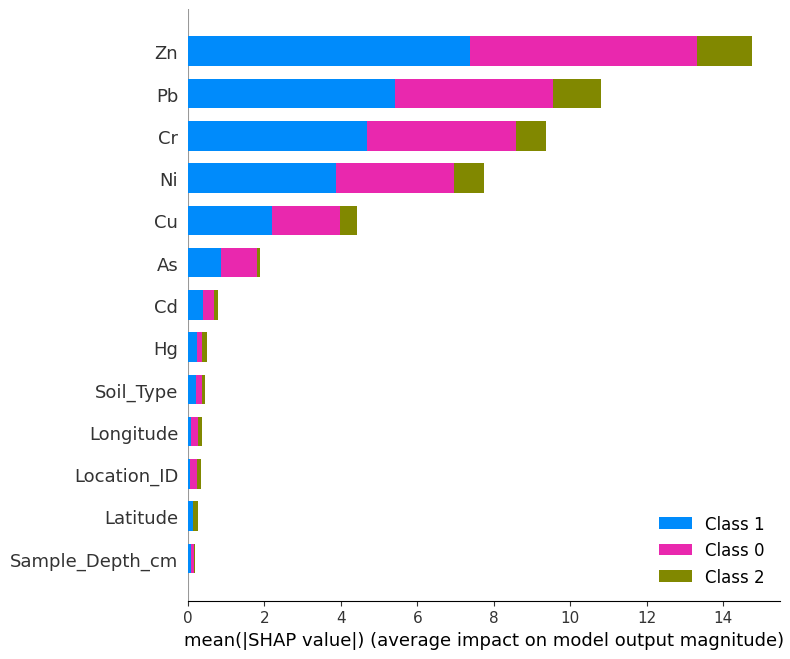

In [44]:
shap.summary_plot(shap_values, X_test, plot_type="bar")

In [45]:
explainer = shap.Explainer(best_lr, X_train)
shap_values = explainer(X_test)

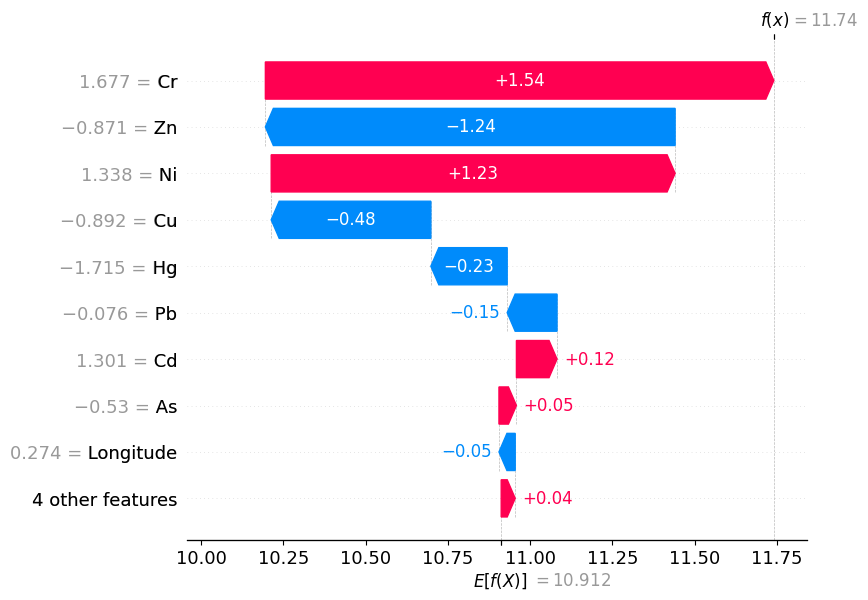

In [46]:
# Class 2= high contamination
shap.plots.waterfall(shap_values[0, :, 2])